Soluciones de ejercicios de la clase 4

Ejercicios I:
---


In [3]:
%matplotlib inline
from __future__ import print_function, division
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('default')
# Libreria de scipy para procesamiento de señales
from scipy import signal

from scipy.io import wavfile
from IPython.display import Audio

import pywt

from scipy import ndimage

from matplotlib import colors

import ipywidgets as widgets 
from IPython.display import display

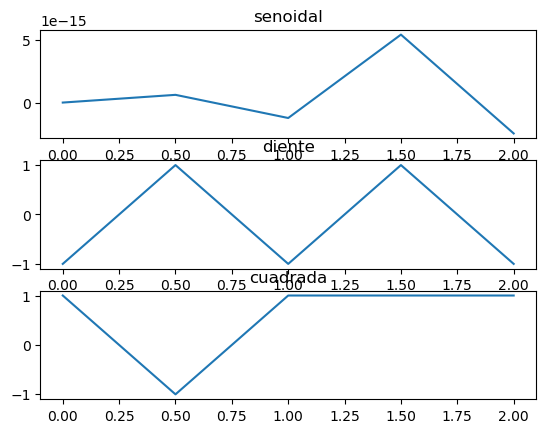

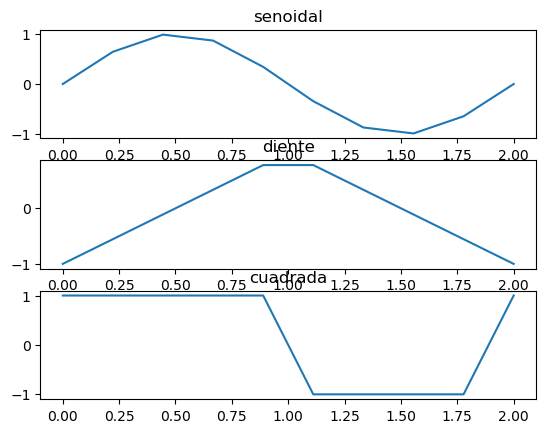

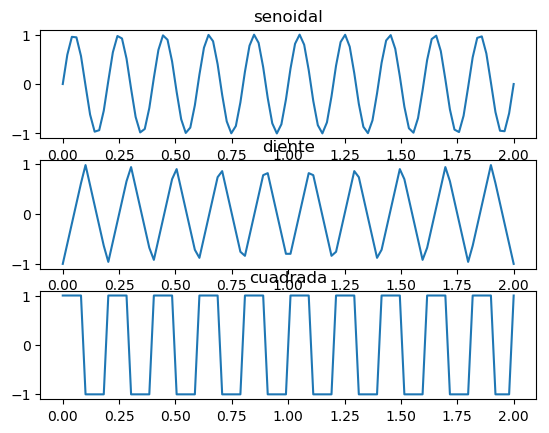

In [6]:
fsA = [5,10,100]
T = 2
f = 5
for fs in fsA:
    t = np.linspace(0, T, fs)
    senoidal = np.sin(2 * np.pi * f * t)
    diente = signal.sawtooth(2 * np.pi * f * t, width=0.5)
    cuadrada = signal.square(2 * np.pi * f * t, duty=0.5)

    signals = (senoidal, diente, cuadrada)
    nombres = ('senoidal', 'diente','cuadrada')
    plt.figure()
    for i, c in enumerate(signals):
        plt.subplot(len(signals), 1, i+1)
        plt.title(nombres[i])
        plt.plot(t, c)

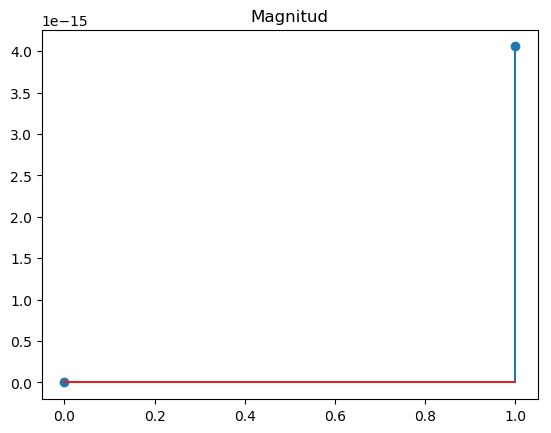

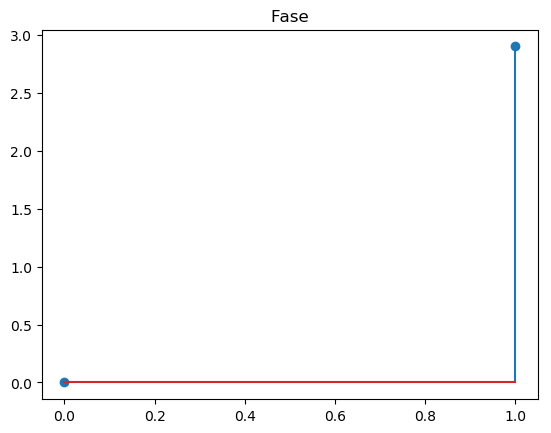

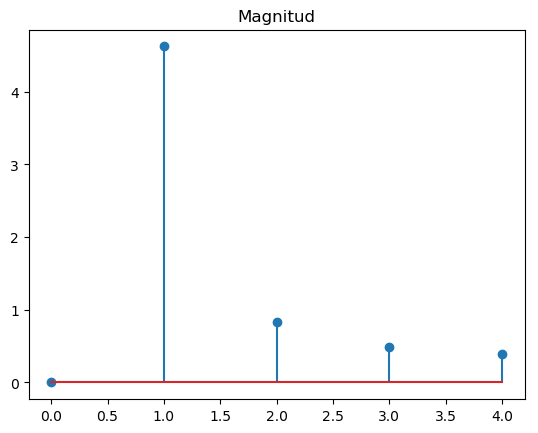

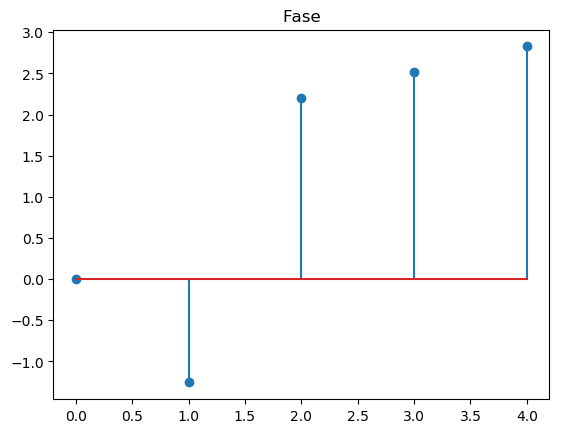

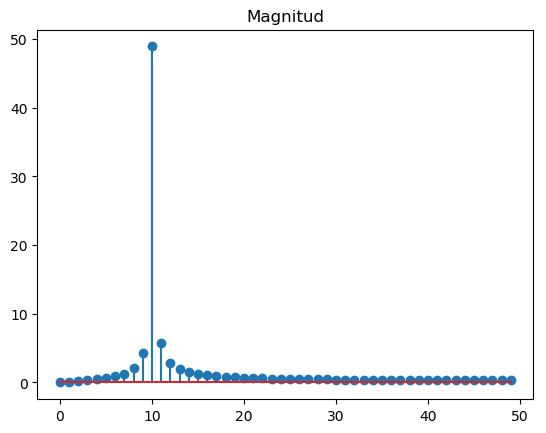

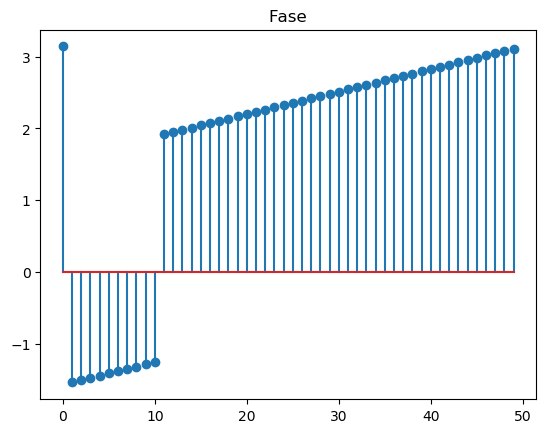

In [7]:
for fs in fsA:
    t = np.linspace(0, T, fs)
    s = np.sin(2 * np.pi * f * t)
    
    plt.figure()
    ff = np.fft.fft(s-s.mean())
    plt.subplots()
    plt.stem(np.abs(ff[:int(len(ff)/2)]))
    plt.title('Magnitud')
    plt.subplots()
    plt.stem(np.angle(ff[:int(len(ff)/2)]))
    plt.title('Fase')

In [8]:
fs, senal = wavfile.read('another3.wav')
Audio(data=senal, rate=fs)

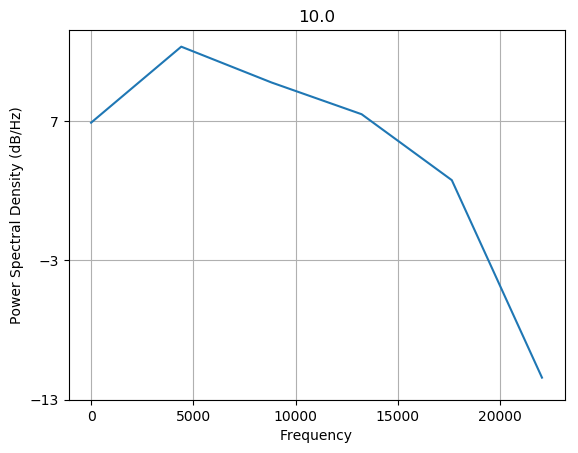

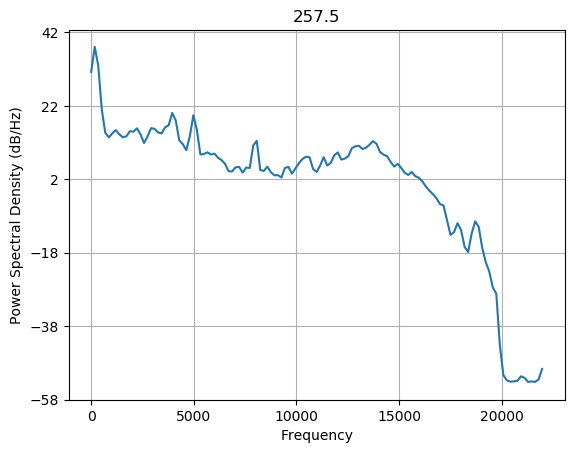

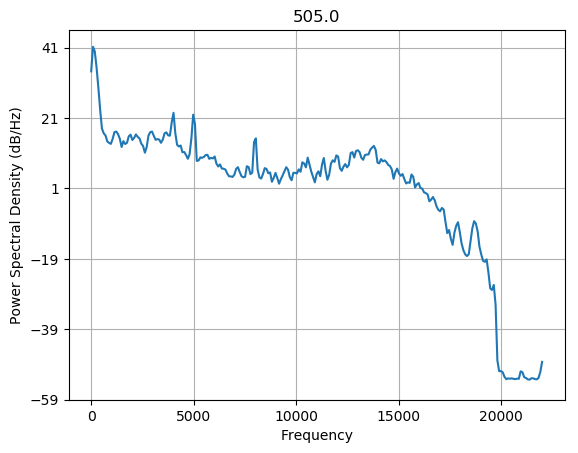

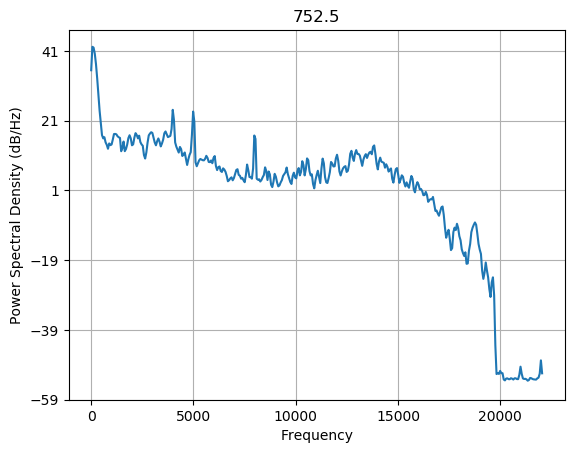

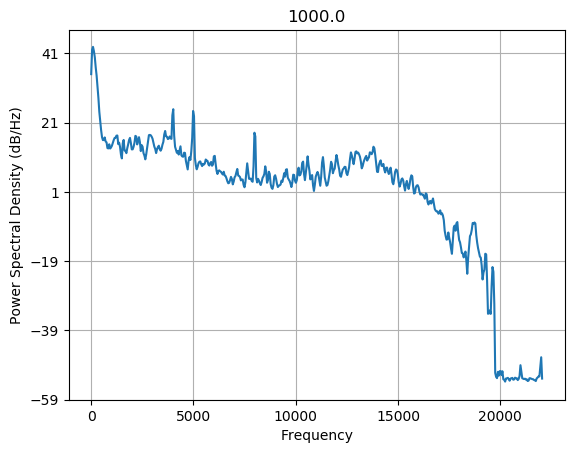

In [9]:
for i in np.linspace(10,1000,5):
    plt.figure()
    plt.title(i)
    psd = plt.psd(senal, detrend='mean',Fs=fs,NFFT=np.int(i))

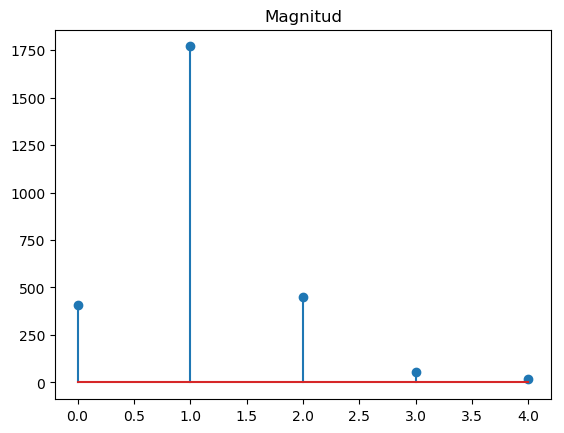

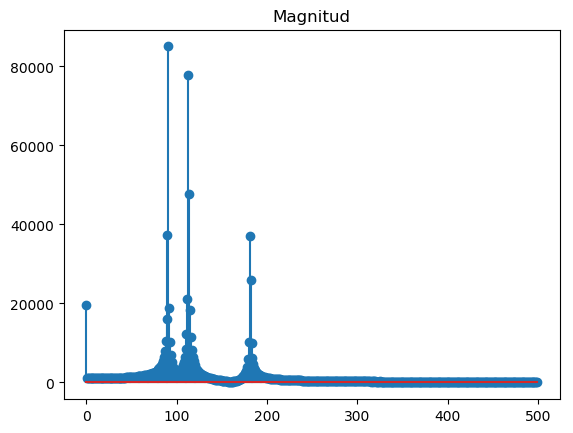

In [10]:
for i in np.linspace(10,1000,2):
    plt.figure()
    ff = np.fft.fft(senal-senal.mean(),n=np.int(i))
    plt.stem(np.abs(ff[:int(len(ff)/2)]))
    plt.title('Magnitud')

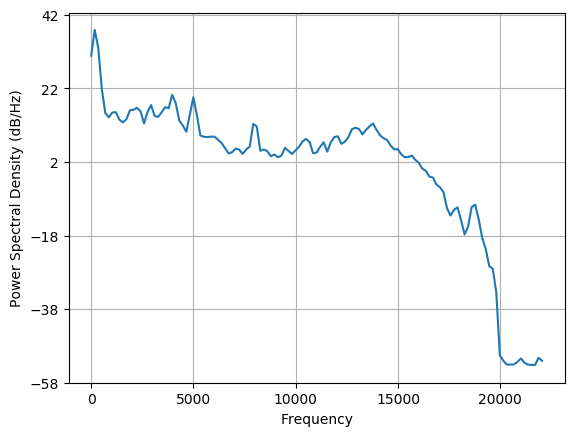

In [11]:
plt.figure()
psd = plt.psd(senal, detrend='mean',Fs=fs)



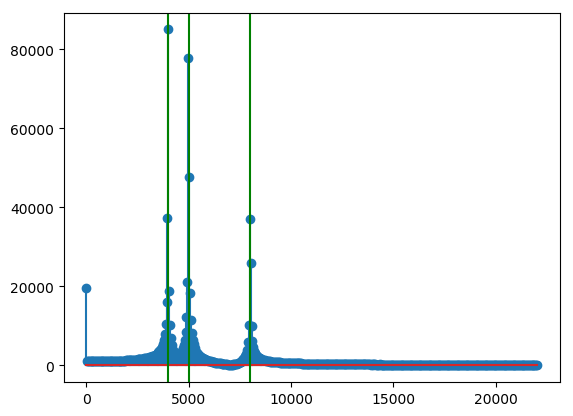

In [12]:
plt.figure()
ff = np.fft.fft(senal-senal.mean(),n=1000)
w  = np.fft.fftfreq(n=1000,d=1/fs)
plt.stem(w[:int(len(w)/2)],np.abs(ff[:int(len(ff)/2)]))
plt.axvline(4000,color='green')
plt.axvline(5000,color='green')
plt.axvline(8000,color='green')
#Frecuencias a retirar aproximadas 

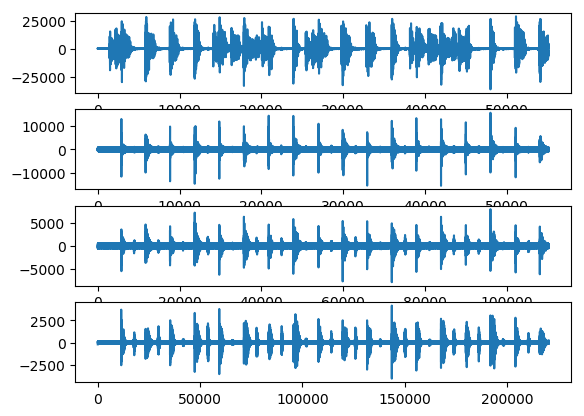

In [13]:
coeffs = pywt.wavedec(senal, 'db2', level=3)
for i, c in enumerate(coeffs):
    plt.subplot(len(coeffs), 1, int(i+1))
    plt.plot(c)

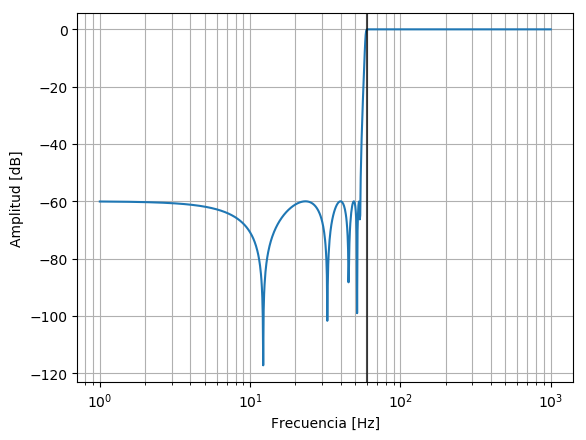

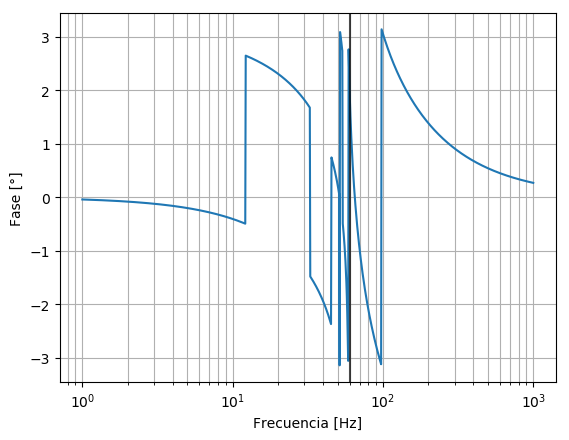

In [14]:
order = 10
freq = 60
rs1 = 0.01 #Colocar un riso bajo mejora el comportamiento de la banda pasante del filtro eliptico
rs2 = 60
b, a = signal.ellip(order, rs1, rs2, freq, analog=True, btype='high') 
plt.figure()
w, h = signal.freqs(b, a, worN=1000)
plt.semilogx(w, 20 * np.log10(abs(h)))
plt.ylabel('Amplitud [dB]')
plt.xlabel('Frecuencia [Hz]')
plt.grid(which='both', axis='both')
plt.axvline(freq,color='black',alpha=0.7)

plt.figure()
plt.semilogx(w, np.angle(h))
plt.ylabel('Fase [°]')
plt.xlabel('Frecuencia [Hz]')
plt.grid(which='both', axis='both')
plt.axvline(freq,color='black',alpha=0.7)


    

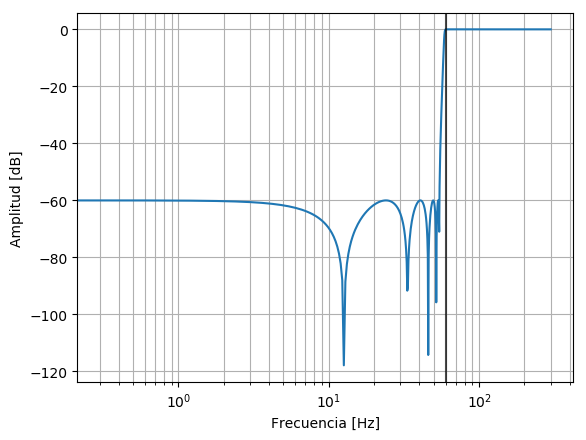

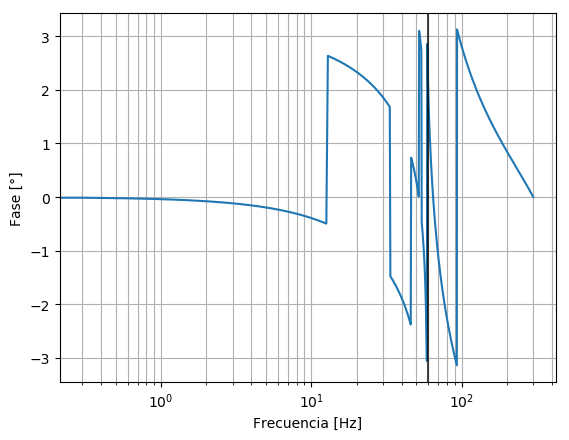

In [15]:
order = 10
freq = 60
rs1 = 0.01 #Colocar un riso bajo mejora el comportamiento de la banda pasante del filtro eliptico
rs2 = 60
fs=600     #Al menos 10 veces mayor
f0=freq/(fs/2)
B, A = signal.ellip(order, rs1, rs2, f0, analog=False,btype='high') 
plt.figure()
w, h = signal.freqz(B, A, worN=1000)  #freqz puesto que es un filtro digital, analogico
#funciona con la transformada Z en lugar de con la transformada de laplace (espacio en unidades S)
# freqz = Z, freqs = S

w = w*fs/(2*np.pi)       #Normalización del espacio de frecuencia usado para probar el filtro
plt.semilogx(w, 20 * np.log10(abs(h)))
plt.ylabel('Amplitud [dB]')
plt.xlabel('Frecuencia [Hz]')
plt.grid(which='both', axis='both')
plt.axvline(freq,color='black',alpha=0.7)

plt.figure()
plt.semilogx(w, np.angle(h))
plt.ylabel('Fase [°]')
plt.xlabel('Frecuencia [Hz]')
plt.grid(which='both', axis='both')
plt.axvline(freq,color='black',alpha=0.7)


In [16]:
print("Valores del filtro 'analogico':\n",a,' \n',b)
print("Longitud del númerador:\n",len(a),"\nLongitud del denominador:\n",len(b) )
print("Valores del filtro 'digital':\n",A,' \n',B)
print("Longitud del númerador:\n",len(a),"\nLongitud del denominador:\n",len(b) )

Valores del filtro 'analogico':
 [1.00000000e+00 2.69864800e+02 4.54248348e+04 5.37276711e+06
 4.99535367e+08 3.61434443e+10 2.20039764e+12 1.00847695e+14
 4.09346033e+15 1.00114318e+17 2.50433457e+18]  
 [9.98849370e-01 0.00000000e+00 8.80654797e+03 0.00000000e+00
 2.84333668e+07 0.00000000e+00 4.01006532e+10 0.00000000e+00
 2.21657430e+13 0.00000000e+00 2.50324108e+15]
Longitud del númerador:
 11 
Longitud del denominador:
 11
Valores del filtro 'digital':
 [  1.          -6.35044267  19.20701582 -35.92812506  45.7419794
 -41.23427507  26.58204389 -12.07738527   3.70024337  -0.69136522
   0.06077094]  
 [  0.24120391  -2.17864564   9.07003268 -22.89451042  38.77678245
 -46.02971549  38.77678245 -22.89451042   9.07003268  -2.17864564
   0.24120391]
Longitud del númerador:
 11 
Longitud del denominador:
 11


Text(0.5,1,'Imagen HSV')

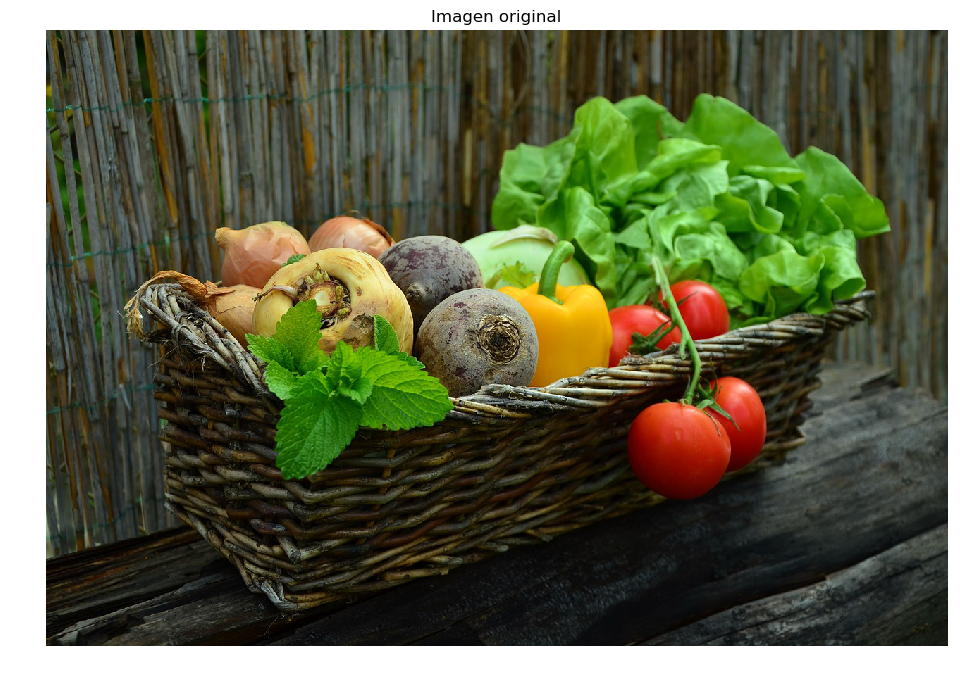

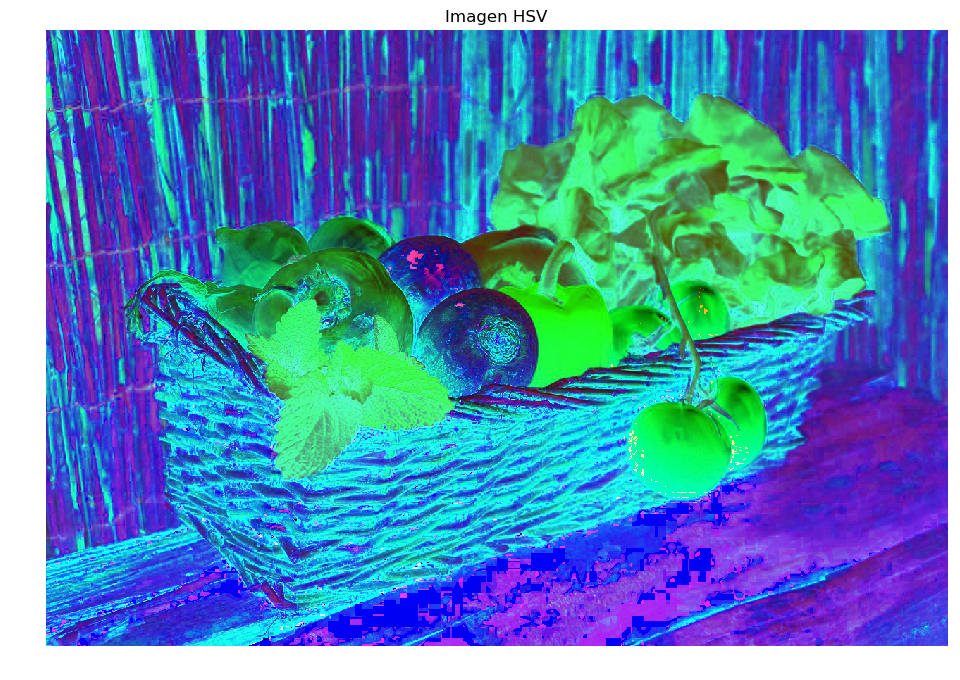

In [17]:
ima = plt.imread('Class3D/canasta.jpg')
plt.figure(figsize=(12,8))
plt.imshow(ima)
plt.axis('off')
plt.title('Imagen original')

ima_hsv = colors.rgb_to_hsv(ima)
plt.figure(figsize=(12,8))
plt.imshow(ima_hsv)
plt.axis('off')
plt.title('Imagen HSV')


In [18]:
ima_hsv2=ima_hsv;

In [19]:
a=ima_hsv2[:,:,0]
ima_hsv2[:,:,0]=ima_hsv2[:,:,0]/a.max() #Ya que deben estar normalizados todos sus valores entre 0 y 1
a=ima_hsv2[:,:,1]
ima_hsv2[:,:,1]=ima_hsv2[:,:,1]/a.max() #Ya que deben estar normalizados todos sus valores entre 0 y 1
a=ima_hsv2[:,:,2]
ima_hsv2[:,:,2]=ima_hsv2[:,:,2]/a.max() #Ya que deben estar normalizados todos sus valores entre 0 y 1


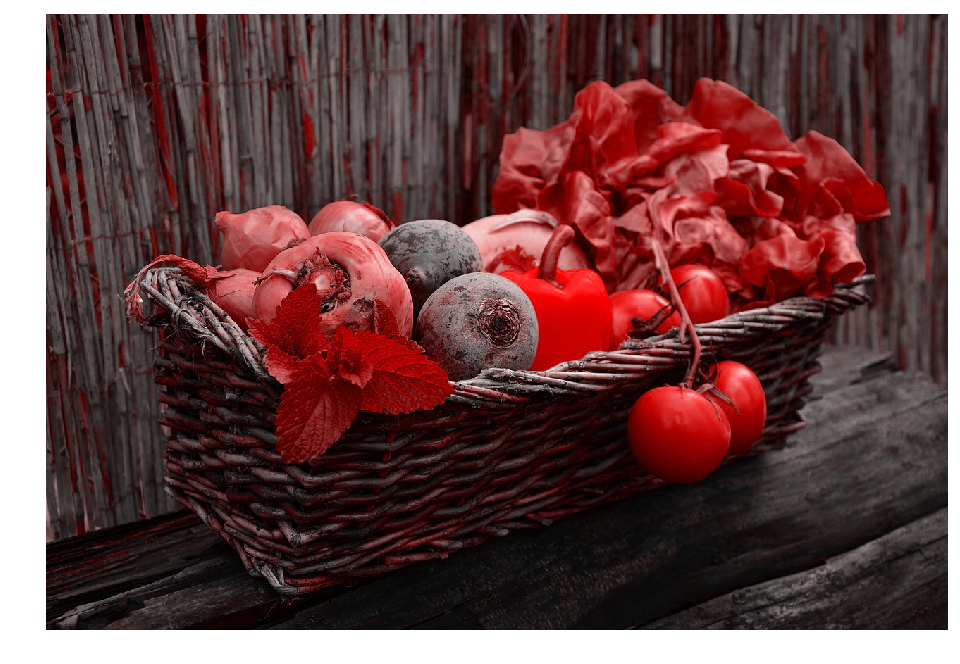

In [22]:
def HSV_variation(tono):
    plt.figure(1, figsize=(12,8))
    ima_hsv2[:,:,0]=tono/.5
    ima_rgb2 = colors.hsv_to_rgb(ima_hsv2)
    plt.imshow(ima_rgb2)
    plt.axis('off')
    plt.show()

interactive_plot = widgets.interactive(HSV_variation, tono=(0,33))
output=interactive_plot.children[-1]
interactive_plot
#Probar valores 0, 11, 22, 33

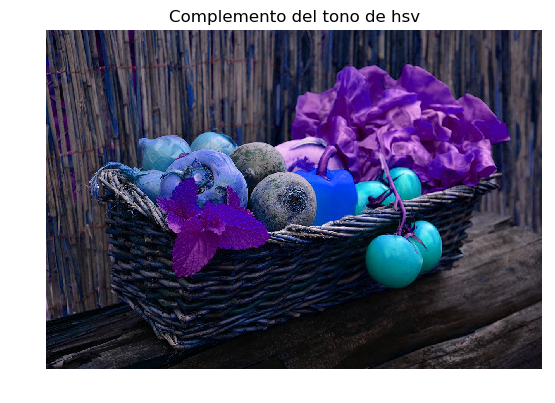

In [23]:
plt.figure()
plt.title('Complemento del tono de hsv')
ima_hsv = colors.rgb_to_hsv(ima)
ima_hsv2[:,:,0]=np.mod(ima_hsv[:,:,0]+0.5,1) #Rotación de 180° en el disco de color: 0 va a 0.5 y 0.5 va a 0
ima_rgb2 = colors.hsv_to_rgb(ima_hsv2)
plt.imshow(ima_rgb2)
plt.axis('off')
plt.show()

/home/carlos/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0.
Use ``matplotlib.pyplot.imread`` instead.
  after removing the cwd from sys.path.


(-0.5, 1279.5, 874.5, -0.5)

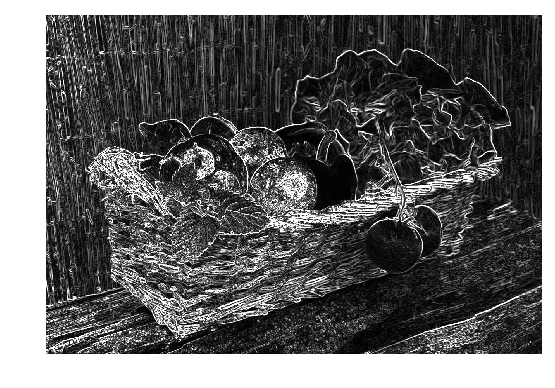

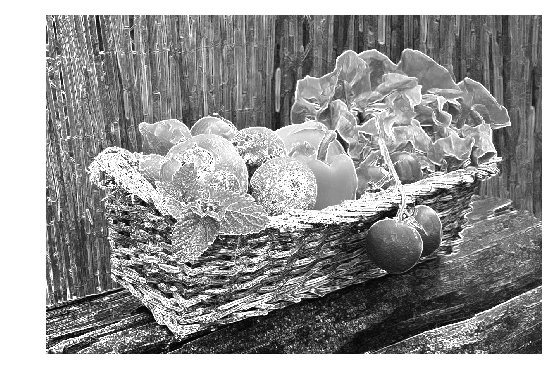

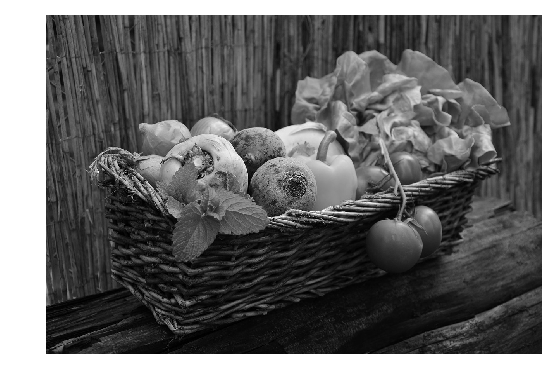

In [24]:
from scipy import ndimage
from skimage import exposure

ima_g = ndimage.imread('Class3D/canasta.jpg', flatten=True)
ima_eq = exposure.equalize_hist(ima_g) * 255
k_sobel_v = [[1, 2, 1],
             [0, 0, 0],
             [-1, -2, -1]]
k_sobel_h = [[1, 0, -1],
             [2, 0, -2],
             [1, 0, -1]]

bordes1 = ndimage.convolve(ima_eq, k_sobel_v, output='int32')
bordes2 = ndimage.convolve(ima_g, k_sobel_h, output='int32')


bordes=np.sqrt(bordes1**2+bordes2**2)
plt.figure()
plt.imshow(abs(bordes), cmap='gray',vmin=0, vmax=255)
plt.axis('off')

plt.figure()
plt.imshow(abs(bordes)+ima_g,cmap='gray',vmin=0,vmax=255)
plt.axis('off')

plt.figure()
plt.imshow(ima_g,cmap='gray',vmin=0,vmax=255)
plt.axis('off')

# Ejercicios parte II:
---


#### Retiraremos las frecuencias de 4K, 5K y 8K Hz ya que son aproximadamente las frecuencias que corresponden al ruído.
El filtro fue ajustado mediante la repetición de variar el filtro

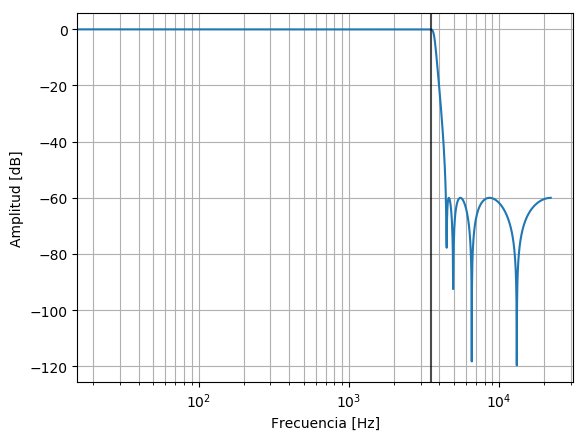

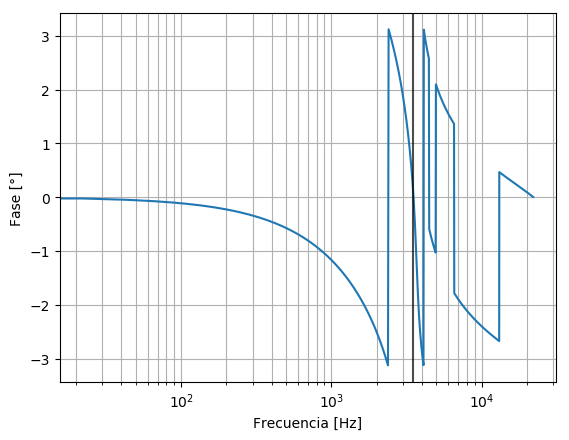

In [25]:
fs, senal = wavfile.read('another3.wav')
#Diseño de filtros
order = 8
freq  = 3500
rs1   = 0.01 #Colocar un riso bajo mejora el comportamiento de la banda pasante del filtro eliptico
rs2   = 60
fs    = 44100
b, a = signal.ellip(order, rs1, rs2, freq/(fs/2)) 
plt.figure()
w, h = signal.freqz(b, a,1000)
plt.semilogx(w*fs/(2*np.pi), 20 * np.log10(abs(h)))
plt.ylabel('Amplitud [dB]')
plt.xlabel('Frecuencia [Hz]')
plt.grid(which='both', axis='both')
plt.axvline(freq,color='black',alpha=0.7)

plt.figure()
plt.semilogx(w*fs/(2*np.pi), np.angle(h))
plt.ylabel('Fase [°]')
plt.xlabel('Frecuencia [Hz]')
plt.grid(which='both', axis='both')
plt.axvline(freq,color='black',alpha=0.7)


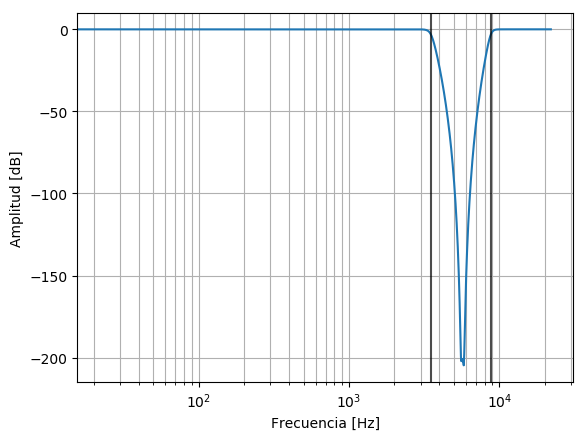

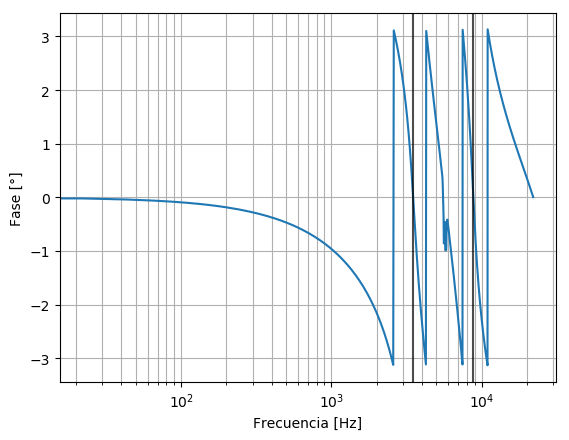

In [26]:
fs, senal = wavfile.read('another3.wav')
#Diseño de filtros
order = 8
freq1  = 4000-500
freq2  = 8000+800
Wid   = 5
B, A = signal.butter(order, [freq1/(fs/2),freq2/(fs/2)], btype='bandstop') 
plt.figure()
w, h = signal.freqz(B, A, worN=1000)
plt.semilogx(w*fs/(2*np.pi), 20 * np.log10(abs(h)))
plt.ylabel('Amplitud [dB]')
plt.xlabel('Frecuencia [Hz]')
plt.grid(which='both', axis='both')
plt.axvline(freq1,color='black',alpha=0.7)
plt.axvline(freq2,color='black',alpha=0.7)

plt.figure()
plt.semilogx(w*fs/(2*np.pi), np.angle(h))
plt.ylabel('Fase [°]')
plt.xlabel('Frecuencia [Hz]')
plt.grid(which='both', axis='both')
plt.axvline(freq1,color='black',alpha=0.7)
plt.axvline(freq2,color='black',alpha=0.7)


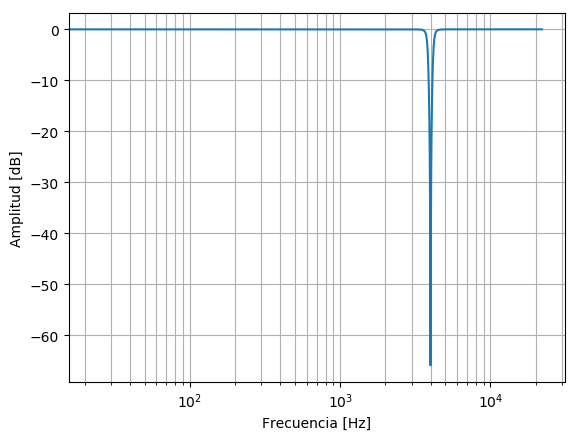

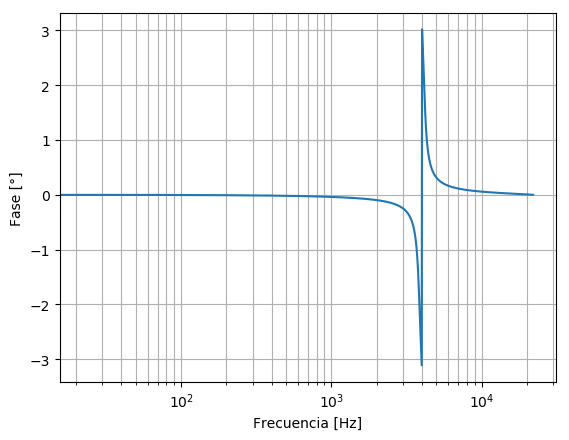

In [27]:
# Filtros butter notch
fs, senal = wavfile.read('another3.wav')
#Diseño de filtros
order = 2
freq1  = 4000
freq2  = 5000
freq3  = 8000
Wid    = 200
Nb1, Na1 = signal.butter(order, [(freq1-Wid)/(fs/2),(freq1+Wid)/(fs/2)], 'bandstop') 
Nb2, Na2 = signal.butter(order, [(freq2-Wid)/(fs/2),(freq2+Wid)/(fs/2)], 'bandstop') 
Nb3, Na3 = signal.butter(order, [(freq3-Wid)/(fs/2),(freq3+Wid)/(fs/2)], 'bandstop') 

plt.figure()
w, h = signal.freqz(Nb1, Na1, worN=1000)
plt.semilogx(w*fs/(2*np.pi), 20 * np.log10(abs(h)))
plt.ylabel('Amplitud [dB]')
plt.xlabel('Frecuencia [Hz]')
plt.grid(which='both', axis='both')

plt.figure()
plt.semilogx(w*fs/(2*np.pi), np.angle(h))
plt.ylabel('Fase [°]')
plt.xlabel('Frecuencia [Hz]')
plt.grid(which='both', axis='both')

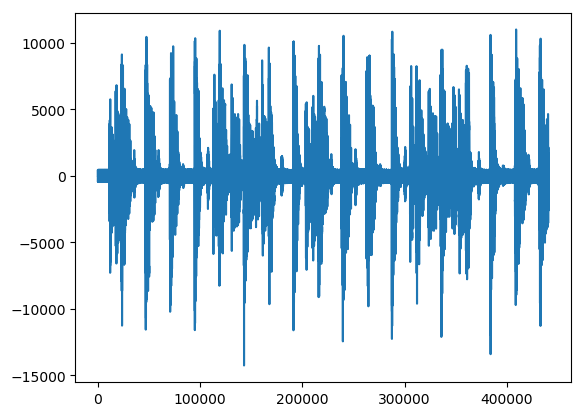

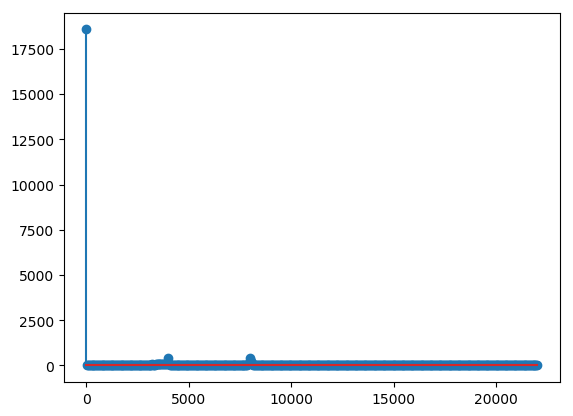

In [28]:
fs, senal = wavfile.read('another3.wav')
plt.plot(senal)
#Aplicación de limpieza con butterworth rechazabanda
senal1 = signal.filtfilt(B, A, senal)
plt.figure()
ff = np.fft.fft(senal1-senal1.mean(),n=1000)
w  = np.fft.fftfreq(n=1000,d=1/fs)
plt.stem(w[:int(len(w)/2)],np.abs(ff[:int(len(ff)/2)]))

#Platillos alterados
Audio(data=senal1, rate=fs)

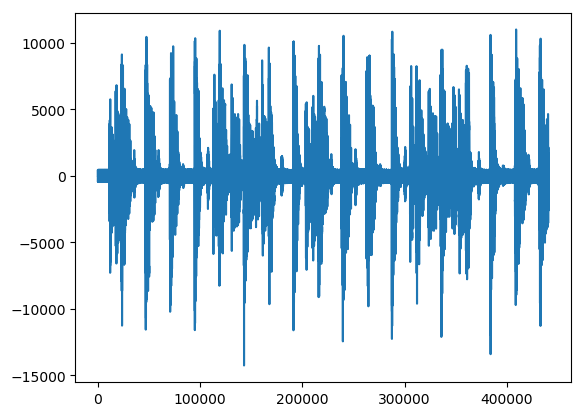

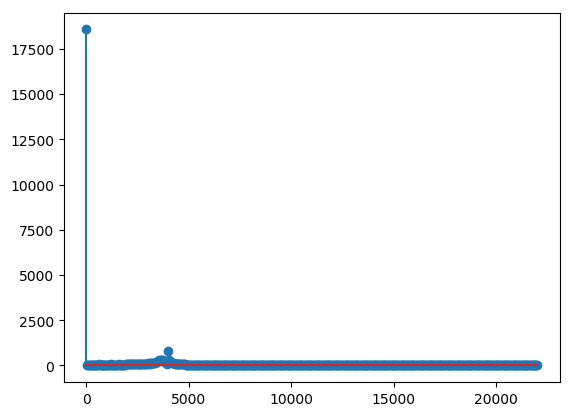

In [29]:
fs, senal = wavfile.read('another3.wav')
plt.plot(senal)
#Aplicación de limpieza con eliptico pasa bajos
senal1 = signal.filtfilt(b, a, senal)
plt.figure()
ff = np.fft.fft(senal1-senal1.mean(),n=1000)
w  = np.fft.fftfreq(n=1000,d=1/fs)
plt.stem(w[:int(len(w)/2)],np.abs(ff[:int(len(ff)/2)]))

#Discos opagados y agravados *
Audio(data=senal1, rate=fs)

In [33]:
#audio original para comparar
fs, senal = wavfile.read('Another.wav')
Audio(data=senal, rate=fs)

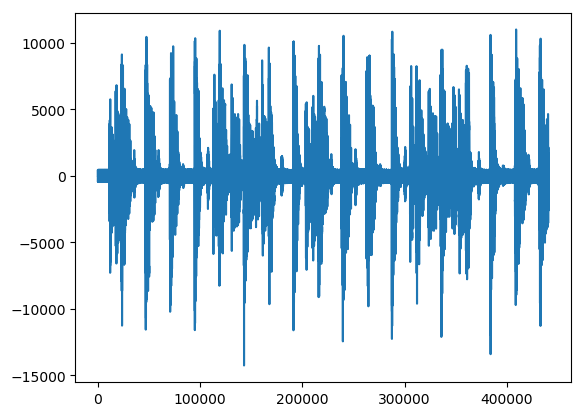

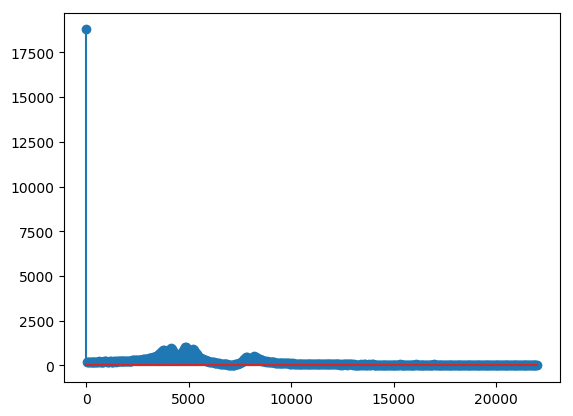

In [34]:
#audio limpio
fs, senal = wavfile.read('another3.wav')
plt.plot(senal)
#Aplicación de limpieza con butterworth rechazabanda
senal1 = signal.filtfilt(Nb1, Na1, senal)
senal2 = signal.filtfilt(Nb2, Na2, senal1)
senal3 = signal.filtfilt(Nb3, Na3, senal2)


Out=senal3
plt.figure()
ff = np.fft.fft(Out-Out.mean(),n=1000)
w  = np.fft.fftfreq(n=1000,d=1/fs)
plt.stem(w[:int(len(w)/2)],np.abs(ff[:int(len(ff)/2)]))


Audio(data=Out, rate=fs)

In [35]:
wavfile.write('Another_limpio.wav',fs,Out)


In [ ]:
#Solución espectograma

In [ ]:
#Solución imagen*